<a href="https://colab.research.google.com/github/valsson-group/UNT-Chem3520/blob/main/Python/DFT_MolecularOrbitals.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Molecular Orbitals from Hartree-Fock Calculations

Simple Juypter notebook that performs Hartree-Fock calculations using pyscf.

Part of the code take from and inspired by https://www.andersle.no/posts/2022/mo/mo.html

## Setup python environment and imports

In [1]:
%%capture
!pip install numpy
!pip install scipy
!pip install Cython
!pip install pandas
!pip install sklearn
!pip install statsmodels
!pip install matplotlib
!pip install seaborn
!pip install rdkit
!pip install py3Dmol
!pip install ipywidgets
!pip install sphinx
!pip install nbsphinx
!pip install pydata-sphinx-theme
!pip install lxml
!pip install fortecubeview
!pip install pythreejs
!pip install scikit-image
!pip install pyscf
!pip install shap
!pip install catboost
!pip install graphviz

In [9]:
import pathlib

# RDKit imports:
from rdkit import Chem
from rdkit.Chem import (
    AllChem,
    rdCoordGen,
)
from rdkit.Chem.Draw import IPythonConsole

IPythonConsole.ipython_useSVG = True  # Use higher quality images for molecules

# For visualization of molecules and orbitals:
import py3Dmol
import fortecubeview

# pyscf imports:
from pyscf import gto, scf, dft

from pyscf.data.nist import HARTREE2EV

# For plotting
import matplotlib
from matplotlib import pyplot as plt
import seaborn as sns

%matplotlib inline
sns.set_theme(style="ticks", context="talk", palette="muted")

# For numerics:
import numpy as np
import pandas as pd

from google.colab import output
output.enable_custom_widget_manager()

pd.options.display.float_format = "{:,.3f}".format

## Definition of Molecule from SMILES String

**Here you should define the smiles string for the molecule you want to consider**




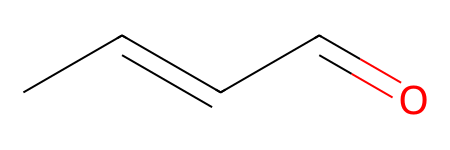

In [3]:
molecule_smiles = "C/C=C/C=O" #@param {type:"string"}

molecule_name = "Mol"
molecule = Chem.MolFromSmiles(molecule_smiles)  # Generate the molecule from smiles
molecule

## Setup of Molecule

In [4]:
def get_xyz(molecule, optimize=False):
    """Get xyz-coordinates for the molecule"""
    mol = Chem.Mol(molecule)
    mol = AllChem.AddHs(mol, addCoords=True)
    AllChem.EmbedMolecule(mol)
    if optimize:  # Optimize the molecules with the MM force field:
        AllChem.MMFFOptimizeMolecule(mol)
    xyz = []
    for lines in Chem.MolToXYZBlock(mol).split("\n")[2:]:
        strip = lines.strip()
        if strip:
            xyz.append(strip)
    xyz = "\n".join(xyz)
    return mol, xyz

In [5]:
molecule3d, xyz = get_xyz(molecule, optimize=True)
print(xyz)

C     -1.755862   -0.105243    0.002175
C     -0.308496   -0.251619    0.345111
C      0.678830    0.295416   -0.377507
C      2.090251    0.112838    0.015817
O      3.001578    0.607259   -0.635644
H     -2.200571   -1.091055   -0.164662
H     -1.909059    0.495710   -0.899838
H     -2.287340    0.377083    0.828200
H     -0.086739   -0.839196    1.233340
H      0.504182    0.887591   -1.268419
H      2.273226   -0.488783    0.921427


In [6]:
view = py3Dmol.view(
    data=Chem.MolToMolBlock(molecule3d),
    style={"stick": {}, "sphere": {"scale": 0.3}},
    width=300,
    height=300,
)
view.zoomTo()

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

## Hartree-Fock Calculations

In [10]:
def run_calculation_dft(xyz, functional="b3lyp", basis="sto-3g"):
    """Calculate the energy (+ additional things like MO coefficients) with pyscf."""
    mol = gto.M(
        atom=xyz,
        basis=basis,
        unit="ANG",
        symmetry=True,
    )
    mol.build()
    mf = dft.RKS(mol)
    mf.xc = functional
    mf.kernel()
    return mf, mol

In [13]:
mf, mol = run_calculation_dft(xyz, basis="sto-3g")

converged SCF energy = -228.263756131794


## Analysis of Results

In [14]:
mf.analyze(verbose=4)

**** SCF Summaries ****
Total Energy =                        -228.263756131793542
Nuclear Repulsion Energy =             153.084471082406509
One-electron Energy =                 -612.914262787678695
Two-electron Coulomb Energy =          264.098844970621315
DFT Exchange-Correlation Energy =      -32.532809397142657
**** MO energy ****
MO #1   energy= -18.8917514429243  occ= 2
MO #2   energy= -10.0741393603183  occ= 2
MO #3   energy= -10.0267487790324  occ= 2
MO #4   energy= -10.023007024021   occ= 2
MO #5   energy= -10.0034879489427  occ= 2
MO #6   energy= -0.98643311719433  occ= 2
MO #7   energy= -0.769410021801417 occ= 2
MO #8   energy= -0.679059046233895 occ= 2
MO #9   energy= -0.556688461645393 occ= 2
MO #10  energy= -0.530596447208146 occ= 2
MO #11  energy= -0.441388884507928 occ= 2
MO #12  energy= -0.39692871389198  occ= 2
MO #13  energy= -0.393091450987226 occ= 2
MO #14  energy= -0.359046957445008 occ= 2
MO #15  energy= -0.334212300145186 occ= 2
MO #16  energy= -0.319768092175

((array([1.99956351, 1.01747584, 1.00939803, 1.05593782, 1.05713698,
         1.99965375, 1.04412167, 0.99565834, 0.97417367, 1.00135648,
         1.99964829, 1.04691988, 1.00335546, 1.01776959, 1.0198916 ,
         1.99972218, 1.05864292, 0.94814781, 0.9524267 , 0.97442454,
         1.99987724, 1.77218435, 1.58966467, 1.26940563, 1.48657163,
         0.94220065, 0.94560738, 0.94220142, 0.95053008, 0.94475929,
         0.98157261]),
  array([-0.13951218, -0.0149639 , -0.08758481,  0.06663585, -0.11770353,
          0.05779935,  0.05439262,  0.05779858,  0.04946992,  0.05524071,
          0.01842739])),
 array([-2.03220463, -0.66408524,  0.80438166]))

In [16]:
table = pd.DataFrame({"Energy [Hartree]": mf.mo_energy, "Occupancy": mf.mo_occ})
table

,Energy [Hartree],Occupancy
0,-18.892,2.000
1,-10.074,2.000
2,-10.027,2.000
3,-10.023,2.000
4,-10.003,2.000
5,-0.986,2.000
6,-0.769,2.000
7,-0.679,2.000
8,-0.557,2.000
9,-0.531,2.000


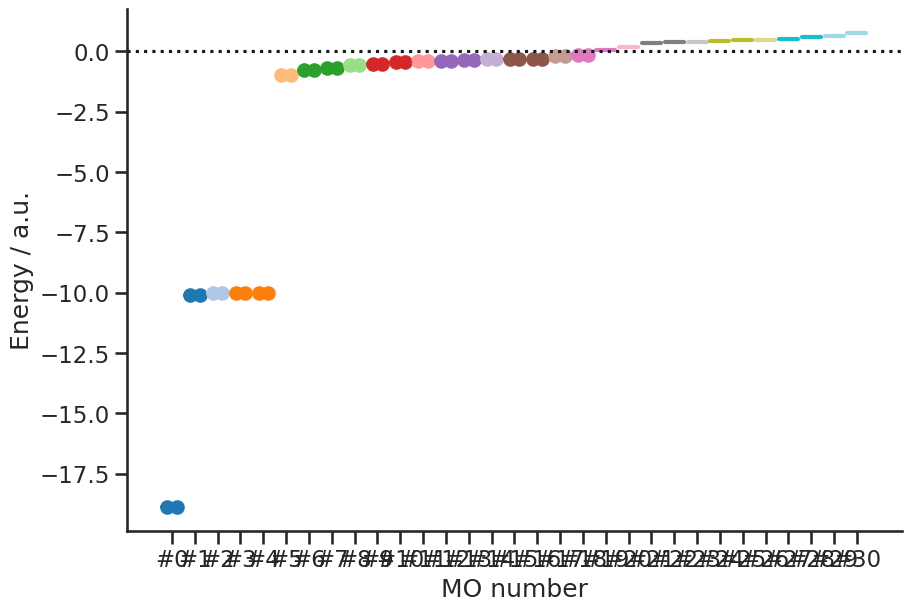

In [17]:
fig, ax = plt.subplots(constrained_layout=True, figsize=(9, 6))
colors = matplotlib.colormaps.get_cmap("tab20")(np.linspace(0, 1, len(mf.mo_energy)))

pos = []
for i, (energy, occ) in enumerate(zip(mf.mo_energy, mf.mo_occ)):
    left = 3 * i
    right = 3 * i + 2.5
    length = right - left

    (line,) = ax.plot([left, right], [energy, energy], color=colors[i], lw=3)

    electron_x, electron_y = None, None
    if occ == 2:
        electron_x = [left + 0.25 * length, left + 0.75 * length]
        electron_y = [energy, energy]
    elif occ == 1:
        electron_x, electron_y = [left + 0.5], [energy]
    if electron_x and electron_y:
        ax.scatter(electron_x, electron_y, color=line.get_color())

    pos.append(left + 0.5 * length)

ax.axhline(y=0, ls=":", color="k")
ax.set_xticks(pos)
ax.set_xticklabels([f"#{i}" for i, _ in enumerate(pos)])
ax.set(xlabel="MO number", ylabel="Energy / a.u.")
sns.despine(fig=fig)

## Setup Orbitals

In [18]:
def write_cube_files(
    max_homo_lumo=5, prefix="", dirname=".", margin=5, write_all_orbitals=False
):
    """Write cube files for the given coefficients."""
    path = pathlib.Path(dirname)
    path.mkdir(parents=True, exist_ok=True)

    # find index of HOMO and LUMO
    lumo = float("inf")
    lumo_idx = None
    homo = -float("inf")
    homo_idx = None
    for i, (energy, occ) in enumerate(zip(mf.mo_energy, mf.mo_occ)):
        if occ > 0 and energy > homo:
            homo = energy
            homo_idx = i
        if occ == 0 and energy < lumo:
            lumo = energy
            lumo_idx = i

    print(f"HOMO (index): {homo_idx}")
    print(f"LUMO (index): {lumo_idx}")
    print("")


    if(write_all_orbitals):
      for i in range(mf.mo_coeff.shape[1]):
        outfile = f"{prefix}Orbital-{i:02d}.cube"
        outfile = path / outfile
        print(f"Writing {outfile}")
        pyscf.tools.cubegen.orbital(mol, outfile, mf.mo_coeff[:, i], margin=margin)
    else:
      print("")
      outfile = f"{prefix}HOMO.cube"
      outfile = path / outfile
      print(f"Writing {outfile}")
      pyscf.tools.cubegen.orbital(mol, outfile, mf.mo_coeff[:, homo_idx], margin=margin)

      outfile = f"{prefix}LUMO.cube"
      outfile = path / outfile
      print(f"Writing {outfile}")
      pyscf.tools.cubegen.orbital(mol, outfile, mf.mo_coeff[:, lumo_idx], margin=margin)

      for i in range(1,max_homo_lumo+1):
        outfile = f"{prefix}HOMO_minus-{i:02d}.cube"
        outfile = path / outfile
        print(f"Writing {outfile}")
        pyscf.tools.cubegen.orbital(mol, outfile, mf.mo_coeff[:, homo_idx-i], margin=margin)

        outfile = f"{prefix}LUMO_plus-{i:02d}.cube"
        outfile = path / outfile
        print(f"Writing {outfile}")
        pyscf.tools.cubegen.orbital(mol, outfile, mf.mo_coeff[:, lumo_idx+i], margin=margin)

In [20]:
!rm -rf cube_files
write_cube_files(
   dirname="cube_files",
   write_all_orbitals=False
)

HOMO (index): 18
LUMO (index): 19


Writing cube_files/HOMO.cube
Writing cube_files/LUMO.cube
Writing cube_files/HOMO_minus-01.cube
Writing cube_files/LUMO_plus-01.cube
Writing cube_files/HOMO_minus-02.cube
Writing cube_files/LUMO_plus-02.cube
Writing cube_files/HOMO_minus-03.cube
Writing cube_files/LUMO_plus-03.cube
Writing cube_files/HOMO_minus-04.cube
Writing cube_files/LUMO_plus-04.cube
Writing cube_files/HOMO_minus-05.cube
Writing cube_files/LUMO_plus-05.cube


## Visualize Orbitals

In [21]:
fortecubeview.plot(path="./cube_files/", width=600, height=300, colorscheme='national')

CubeViewer: listing cube files from the directory ./cube_files/
Reading 12 cube files


HTML(value='\n        <style>\n           .jupyter-widgets-output-area .output_scroll {\n                heigh…

interactive(children=(Select(description='Cube files:', options=('./cube_files/HOMO.cube', './cube_files/HOMO_…

TraitError: The 'target' trait of a DirectionalLight instance expected an Uninitialized or an Object3D, not the str 'IPY_MODEL_9942f587-ec03-4d64-b394-bb83516e26f7'.